In [23]:
# From the transformers package, import ViTFeatureExtractor and ViTForImageClassification
from transformers import ViTFeatureExtractor, ViTForImageClassification

# From the PIL package, import Image and Markdown
from PIL import Image

# import requests
import requests

# import torch
import torch

# import matplotlib
import matplotlib.pyplot as plt

# url getter for mpl
import urllib

import numpy as np

In [2]:
# Load the feature extractor for the vision transformer
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')

# Load the pre-trained weights from vision transformer
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

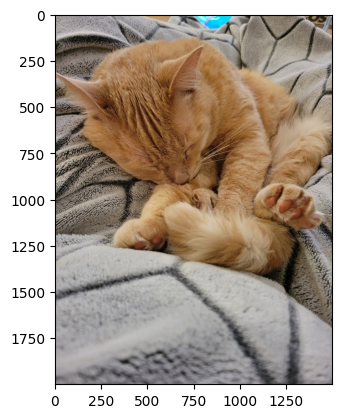

In [29]:

# create a file-like object from the url
f = urllib.request.urlopen("https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:xeoa6zhnvmrnwb2jajkzgdew/bafkreiguwoio63ksukkjkwgudgzxjq7yxxogxk2xbiusnhbwpprjvyzpgu@jpeg") # a random bluesky url to test

# read the image file in a numpy array
image = plt.imread(f, format='jpeg') # bluesky always uses jpegs, default for imread is pngs
plt.imshow(image)


In [30]:
# Extract features from the image using the feature extractor
inputs = feature_extractor(images=image, return_tensor="pt")

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


In [38]:
# Extracted pixel values from the image
pixel_values = inputs["pixel_values"]
pixel_values = np.array(pixel_values)
pixel_values = torch.tensor(pixel_values)

In [39]:
# Make predictions using the ViT model
outputs = model(pixel_values)

In [40]:
# Get the logits (raw scores) for different classes
logits = outputs.logits

# Determine the number of classes
logits.shape

torch.Size([1, 1000])

In [59]:
# Find the index of the predicted class with the highest probability
predicted_class_idx = logits.argmax(-1).item()
top_10_predictions = [torch.argsort(logits, descending=True)[0][i].item() for i in range(10)]


# Display the index of the class
# print(predicted_class_idx)
print(top_10_predictions)

[750, 282, 281, 797, 285, 761, 287, 283, 831, 520]


In [60]:
# Extract the class name using the model's configuration
for pred in top_10_predictions:
  predicted_class = model.config.id2label[pred]
  print(predicted_class)

# Display the predicted class name

quilt, comforter, comfort, puff
tiger cat
tabby, tabby cat
sleeping bag
Egyptian cat
remote control, remote
lynx, catamount
Persian cat
studio couch, day bed
crib, cot


In [44]:
print(model.config.id2label)

{0: 'tench, Tinca tinca', 1: 'goldfish, Carassius auratus', 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 3: 'tiger shark, Galeocerdo cuvieri', 4: 'hammerhead, hammerhead shark', 5: 'electric ray, crampfish, numbfish, torpedo', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich, Struthio camelus', 10: 'brambling, Fringilla montifringilla', 11: 'goldfinch, Carduelis carduelis', 12: 'house finch, linnet, Carpodacus mexicanus', 13: 'junco, snowbird', 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 15: 'robin, American robin, Turdus migratorius', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water ouzel, dipper', 21: 'kite', 22: 'bald eagle, American eagle, Haliaeetus leucocephalus', 23: 'vulture', 24: 'great grey owl, great gray owl, Strix nebulosa', 25: 'European fire salamander, Salamandra salamandra', 26: 'common newt, Triturus vulgaris', 27: 'eft', 28: 'spotted salamander, Ambystoma maculatum', 29: 'axolotl, mu

In [ ]:
#PRINTED OUT ALL OF THE ID2LABELS AND MANUALLY CTRL+F'D FOR CATS LOL
# 281: 'tabby, tabby cat'
# 282: 'tiger cat', 283: 'Persian cat', 284: 'Siamese cat, Siamese', 285: 'Egyptian cat', 286: 'cougar, puma, catamount, mountain lion, painter, panther, Felis concolor', 287: 'lynx, catamount', 288: 'leopard, Panthera pardus', 289: 'snow leopard, ounce, Panthera uncia', 290: 'jaguar, panther, Panthera onca, Felis onca', 291: 'lion, king of beasts, Panthera leo', 292: 'tiger, Panthera tigris', 293: 'cheetah, chetah, Acinonyx jubatus',

# 281 to 293 are all of the cats

In [78]:
# now all together in one function
cat_labels = set()
for i in range(281, 294):
  cat_labels.add(i)

def test_bsky_image(url):

  f = urllib.request.urlopen(url)
  image = plt.imread(f, format='jpeg')
  plt.imshow(image)
  inputs = feature_extractor(images=image, return_tensor="pt")
  pixel_values = inputs["pixel_values"]
  pixel_values = np.array(pixel_values)
  pixel_values = torch.tensor(pixel_values)
  outputs = model(pixel_values)
  logits = outputs.logits
  predicted_class_idx = logits.argmax(-1).item()
  top_10_predictions = [torch.argsort(logits, descending=True)[0][i].item() for i in range(10)]
  print(top_10_predictions)
  found_cat_label = False
  for pred in top_10_predictions:
    predicted_class = model.config.id2label[pred]
    print(predicted_class)
    if pred in cat_labels:
      found_cat_label = True
  print(found_cat_label)


[284, 285, 905, 281, 520, 287, 811, 750, 753, 904, 680, 283, 282, 761, 552, 850, 588, 516, 700, 797, 431, 359, 673, 225, 539]
Siamese cat, Siamese
Egyptian cat
window shade
tabby, tabby cat
crib, cot
lynx, catamount
space heater
quilt, comforter, comfort, puff
radiator
window screen
nipple
Persian cat
tiger cat
remote control, remote
feather boa, boa
teddy, teddy bear
hamper
cradle
paper towel
sleeping bag
bassinet
black-footed ferret, ferret, Mustela nigripes
mouse, computer mouse
malinois
doormat, welcome mat
True


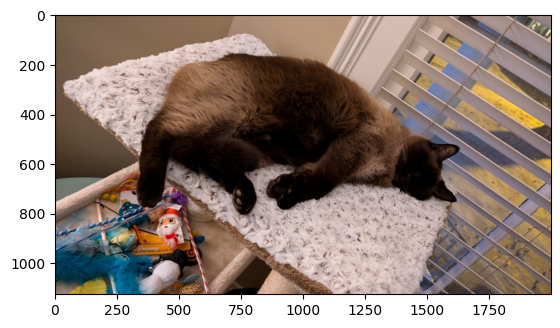

In [74]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:ktkc7jfakxzjpooj52ffc6ra/bafkreib35bmivut7vzognt5zhs5tfm5p76cig2jmfzuaalnxtafmp5pn64@jpeg')

[598, 851, 548, 782, 632, 664, 527, 745, 453, 673, 848, 498, 526, 761, 681, 754, 508, 485, 620, 854, 916, 742, 482, 811, 651]
home theater, home theatre
television, television system
entertainment center
screen, CRT screen
loudspeaker, speaker, speaker unit, loudspeaker system, speaker system
monitor
desktop computer
projector
bookcase
mouse, computer mouse
tape player
cinema, movie theater, movie theatre, movie house, picture palace
desk
remote control, remote
notebook, notebook computer
radio, wireless
computer keyboard, keypad
CD player
laptop, laptop computer
theater curtain, theatre curtain
web site, website, internet site, site
printer
cassette player
space heater
microwave, microwave oven
False


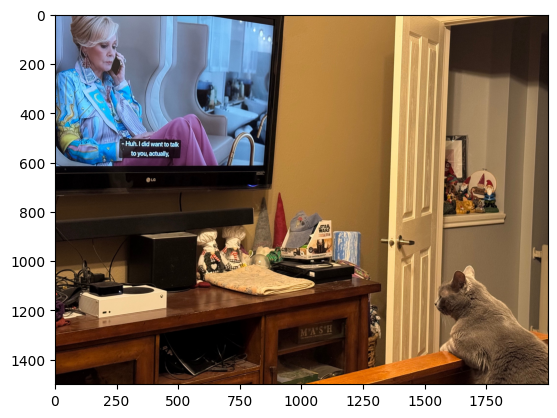

In [75]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:ma4cyjv2pxj7mo2udpauwfwf/bafkreidktaibkveaw24cnesfsryfgc3x6tfh33elj5qxa6viz7zrjov6pa@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[281, 478, 282, 285, 283, 778, 519, 790, 284, 539, 674, 722, 620, 788, 673, 492, 700, 223, 446, 287, 613, 811, 462, 463, 588]
tabby, tabby cat
carton
tiger cat
Egyptian cat
Persian cat
scale, weighing machine
crate
shopping basket
Siamese cat, Siamese
doormat, welcome mat
mousetrap
ping-pong ball
laptop, laptop computer
shoe shop, shoe-shop, shoe store
mouse, computer mouse
chest
paper towel
schipperke
binder, ring-binder
lynx, catamount
joystick
space heater
broom
bucket, pail
hamper
True


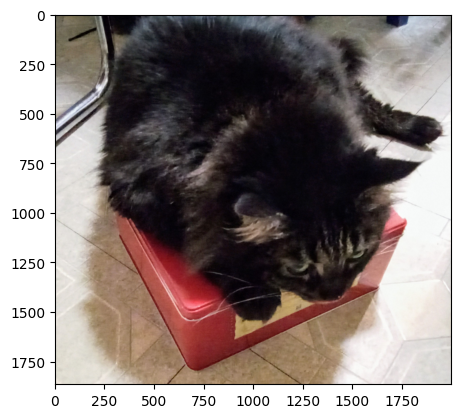

In [76]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:chcajl46xms4vlq7yzup5jwo/bafkreiezlis7deyhatrnevx3sntbsxyx33a6x6mwzj45jtlwdcj2ulumlm@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[811, 285, 753, 733, 897, 882, 894, 799, 760, 282, 840, 281, 158, 195, 516, 539, 831, 264, 519, 223, 520, 227, 674, 729, 713]
space heater
Egyptian cat
radiator
pole
washer, automatic washer, washing machine
vacuum, vacuum cleaner
wardrobe, closet, press
sliding door
refrigerator, icebox
tiger cat
swab, swob, mop
tabby, tabby cat
toy terrier
Boston bull, Boston terrier
cradle
doormat, welcome mat
studio couch, day bed
Cardigan, Cardigan Welsh corgi
crate
schipperke
crib, cot
kelpie
mousetrap
plate rack
photocopier
True


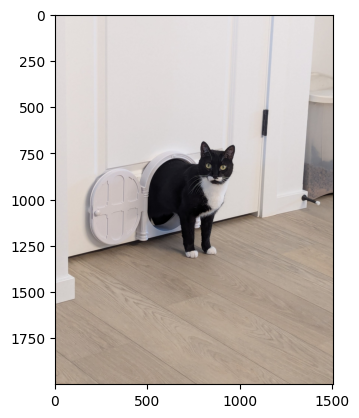

In [77]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:jvwv2zv733cehjxgnr5jhsih/bafkreigpqyli4cyktaweh4w5osqsr3sgja4p7xplnntmbp2ktkfpd6z5me@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[600, 488, 749, 714, 584, 772, 71, 680, 361, 512]
hook, claw
chain
quill, quill pen
pick, plectrum, plectron
hair slide
safety pin
scorpion
nipple
skunk, polecat, wood pussy
corkscrew, bottle screw
False


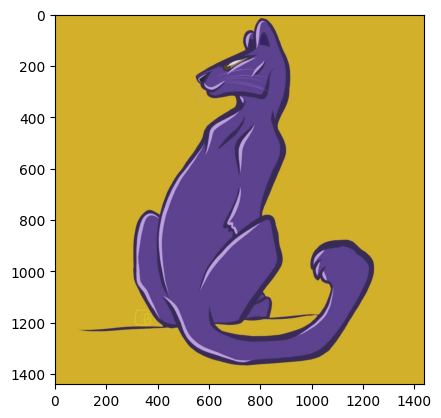

In [79]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:5nnse3lq4ds4cpift5vcd7rl/bafkreiahngmsliv4kbporwaq73dpqh7wgwsvcbbwozmsd3e5ythmvhikmy@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[917, 731, 541, 643, 921, 470, 644, 846, 542, 611]
comic book
plunger, plumber's helper
drum, membranophone, tympan
mask
book jacket, dust cover, dust jacket, dust wrapper
candle, taper, wax light
matchstick
table lamp
drumstick
jigsaw puzzle
False


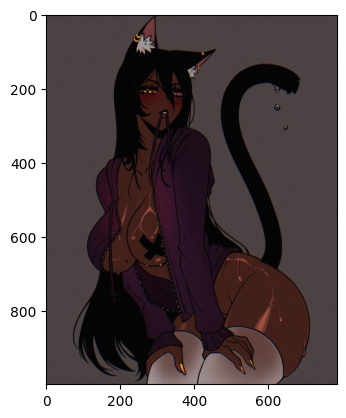

In [80]:
test_bsky_image('https://cdn.bsky.app/img/feed_thumbnail/plain/did:plc:mwgk3b4ed7hpvcgwtt2m4gvo/bafkreif7idkruq4hfs2h362a44y3katcf2mihrokbo4zho6jixvk4zixzu@jpeg')

[285, 284, 281, 282, 287, 283, 248, 811, 158, 250]
Egyptian cat
Siamese cat, Siamese
tabby, tabby cat
tiger cat
lynx, catamount
Persian cat
Eskimo dog, husky
space heater
toy terrier
Siberian husky
True


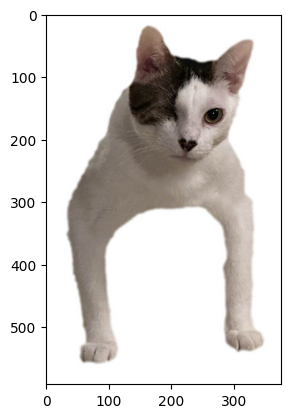

In [81]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:a7zqkxgbu3i7cbpeec3lqh6v/bafkreihovtulsck2knx67gmcygxvealn63edey3ol4mo5u22piomi455ku@jpeg')

[285, 281, 282, 283, 287, 678, 700, 568, 673, 620]
Egyptian cat
tabby, tabby cat
tiger cat
Persian cat
lynx, catamount
neck brace
paper towel
fur coat
mouse, computer mouse
laptop, laptop computer
True


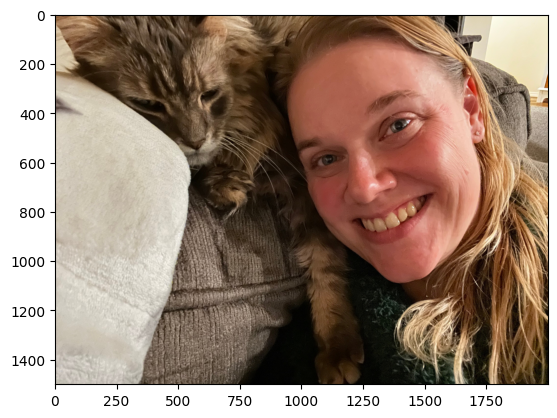

In [82]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:so4lx2vbx45hbi4oekwtvvp4/bafkreic7y6ozgronltibdo2bopkqkvenkq65abkdsctfi24mt27rjxd22a@jpeg')

[916, 590, 782, 664, 851, 917, 903, 681, 527, 400]
web site, website, internet site, site
hand-held computer, hand-held microcomputer
screen, CRT screen
monitor
television, television system
comic book
wig
notebook, notebook computer
desktop computer
academic gown, academic robe, judge's robe
False


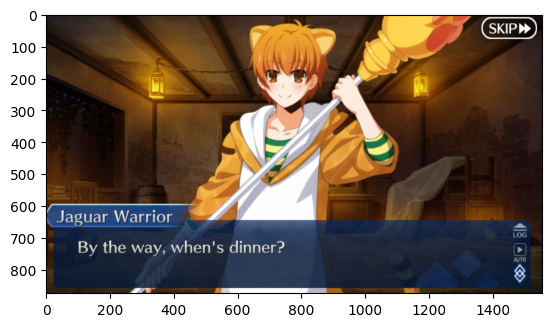

In [83]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:mtw6zwee5vbh2t7hii7q7thv/bafkreidgi2e5syvlwuzqmhjizqk3sjjru7qmfd6crjznkhqqp2juitn4wy@jpeg')

[169, 285, 284, 242, 246, 208, 173, 222, 676, 236]
borzoi, Russian wolfhound
Egyptian cat
Siamese cat, Siamese
boxer
Great Dane
Labrador retriever
Ibizan hound, Ibizan Podenco
kuvasz
muzzle
Doberman, Doberman pinscher
True


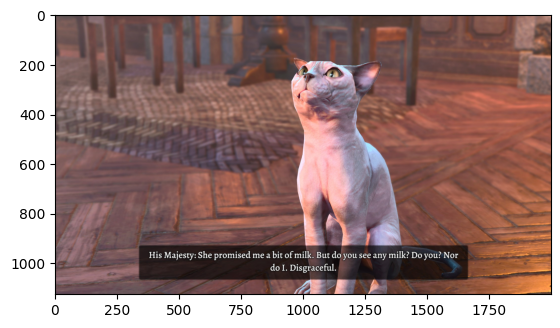

In [84]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:pv5zxv6zee5r362xktkxu44n/bafkreibuufjm34wolkacfz2gn3pk7zo2dp67fc4jmcnsmorbwsn7vgudaq@jpeg')

[831, 164, 703, 233, 244, 706, 256, 201, 174, 226]
studio couch, day bed
bluetick
park bench
Bouvier des Flandres, Bouviers des Flandres
Tibetan mastiff
patio, terrace
Newfoundland, Newfoundland dog
silky terrier, Sydney silky
Norwegian elkhound, elkhound
briard
False


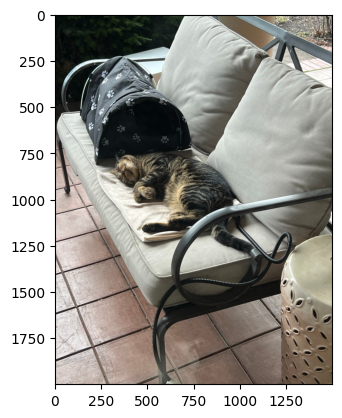

In [85]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:knmb327nr5arfnuhksemzsln/bafkreihwhwozxn5wijjjkmvd35mjdcb7jxhf6tragua7te5hesqzzc4xga@jpeg')

[285, 223, 224, 282, 208, 281, 283, 361, 205, 295]
Egyptian cat
schipperke
groenendael
tiger cat
Labrador retriever
tabby, tabby cat
Persian cat
skunk, polecat, wood pussy
flat-coated retriever
American black bear, black bear, Ursus americanus, Euarctos americanus
True


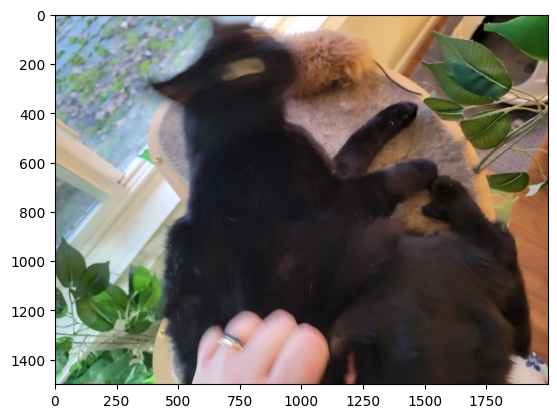

In [86]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:szz5ukmc6gdzvtjtpreuskus/bafkreihnnkexye56hiqooob4ixdpyouazg5j34wdtrbwkdjpl5yu3w57ii@jpeg')

[285, 282, 281, 622, 174, 457, 676, 283, 287, 284]
Egyptian cat
tiger cat
tabby, tabby cat
lens cap, lens cover
Norwegian elkhound, elkhound
bow tie, bow-tie, bowtie
muzzle
Persian cat
lynx, catamount
Siamese cat, Siamese
True


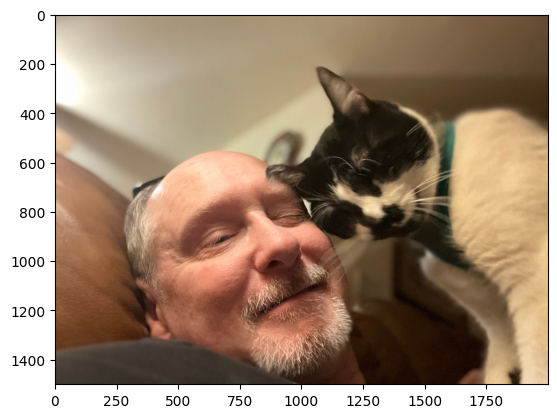

In [87]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:kmmjshx2a3k72q4qcrp35zwj/bafkreignggeebxsq7hr7z2ub3ypfmhwmruushd5ap56vvbwjur5kibd5uy@jpeg')

[541, 427, 492, 588, 516, 519, 846, 577, 619, 861]
drum, membranophone, tympan
barrel, cask
chest
hamper
cradle
crate
table lamp
gong, tam-tam
lampshade, lamp shade
toilet seat
False


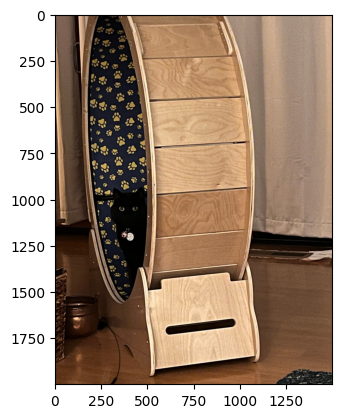

In [88]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:hl6hfgbbxnk66lepqweh24pj/bafkreifjhonmpv4bk7td3hcfsr64khm6qi766njyvj2hv5hdjebnnncfei@jpeg')

[887, 808, 400, 678, 699, 750, 453, 667, 456, 406]
vestment
sombrero
academic gown, academic robe, judge's robe
neck brace
panpipe, pandean pipe, syrinx
quilt, comforter, comfort, puff
bookcase
mortarboard
bow
altar
False


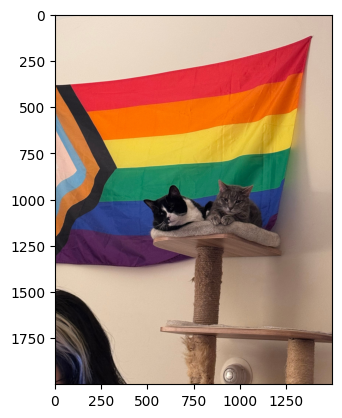

In [89]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:qayioqtocmnmekfzu5rtci3p/bafkreiarihgybrrjqsm2ynvqkuf3vofn5hezhdficu33fbfeny5ztjyu7q@jpeg')

[750, 797, 885, 831, 721, 520, 431, 564, 434, 753]
quilt, comforter, comfort, puff
sleeping bag
velvet
studio couch, day bed
pillow
crib, cot
bassinet
four-poster
bath towel
radiator
False


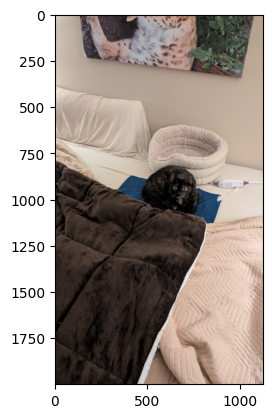

In [90]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:ynbcieuws3cyyk6qpdin6org/bafkreidi62sfp3jbaltaekldmaocmukexnwbaf3aqopwzzbsfanoh3gvia@jpeg')

[917, 419, 584, 549, 921, 772, 446, 611, 680, 868]
comic book
Band Aid
hair slide
envelope
book jacket, dust cover, dust jacket, dust wrapper
safety pin
binder, ring-binder
jigsaw puzzle
nipple
tray
False


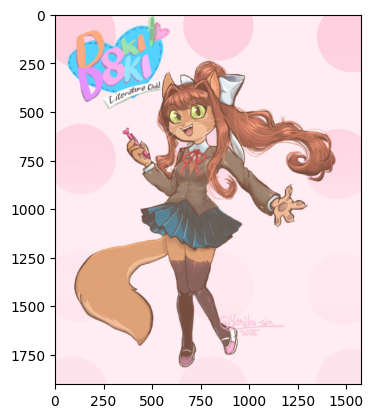

In [91]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:pmuodbqvrf66rsopq2xnh3er/bafkreics7nrsrgfqzlkreax7xy6po7tilmxwuxxupp5d7qmdwqixg65dgm@jpeg')

[461, 917, 787, 524, 490, 626, 501, 892, 921, 409]
breastplate, aegis, egis
comic book
shield, buckler
cuirass
chain mail, ring mail, mail, chain armor, chain armour, ring armor, ring armour
lighter, light, igniter, ignitor
cloak
wall clock
book jacket, dust cover, dust jacket, dust wrapper
analog clock
False


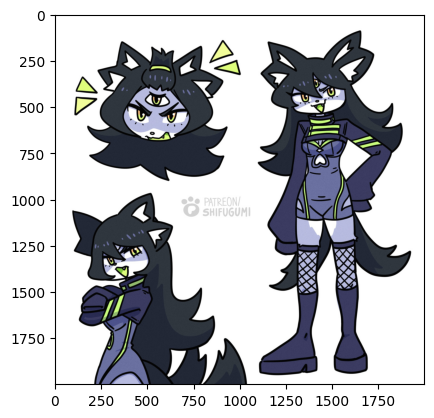

In [92]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:pndyuabi5uhdduu3l4kdho2w/bafkreihpzhznltucqbcpsnv2to3p3p6asb7b6f6ynawlcebn72zcd7fq6i@jpeg')

[917, 235, 285, 151, 174, 676, 921, 227, 223, 225]
comic book
German shepherd, German shepherd dog, German police dog, alsatian
Egyptian cat
Chihuahua
Norwegian elkhound, elkhound
muzzle
book jacket, dust cover, dust jacket, dust wrapper
kelpie
schipperke
malinois
True


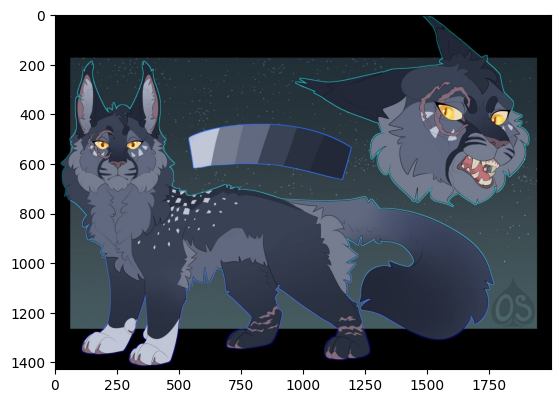

In [93]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:zba75di7jyq6oubxto2jfaki/bafkreiekgbikbcdefiyxz7bwlr6wl7z3n5t6r6da4z32s3j7m3oulxlo3m@jpeg')

[285, 227, 223, 273, 151, 224, 274, 282, 174, 248]
Egyptian cat
kelpie
schipperke
dingo, warrigal, warragal, Canis dingo
Chihuahua
groenendael
dhole, Cuon alpinus
tiger cat
Norwegian elkhound, elkhound
Eskimo dog, husky
True


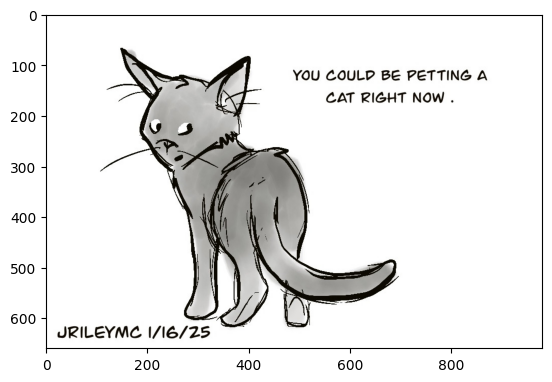

In [94]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:x2lfkvp36arsfoclftktlnsu/bafkreideavh2mqlzgw5jo2sw62hozcidoxpgnyugyizdk7en7wkz5kbeku@jpeg')

[284, 673, 761, 285, 287, 620, 750, 633, 447, 837]
Siamese cat, Siamese
mouse, computer mouse
remote control, remote
Egyptian cat
lynx, catamount
laptop, laptop computer
quilt, comforter, comfort, puff
loupe, jeweler's loupe
binoculars, field glasses, opera glasses
sunglasses, dark glasses, shades
True


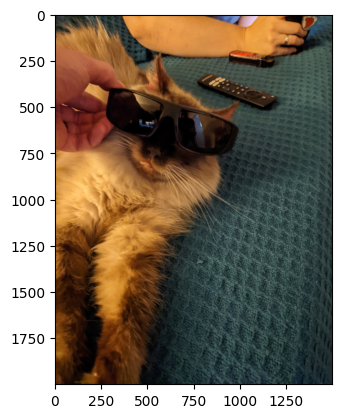

In [95]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:j75ijdhkboej3eeie45dgexs/bafkreigmrkprlrwbemgxbzhodz26ozgiud3kwxybve3splqwawg4b47mme@jpeg')

[549, 719, 680, 697, 865, 588, 520, 529, 917, 584]
envelope
piggy bank, penny bank
nipple
pajama, pyjama, pj's, jammies
toyshop
hamper
crib, cot
diaper, nappy, napkin
comic book
hair slide
False


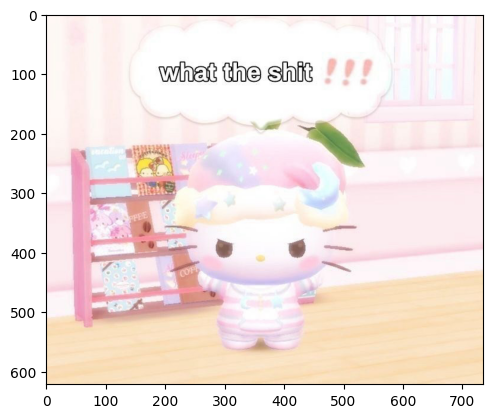

In [96]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:nis3dxiqule7sm2vmsp47nng/bafkreic3sw5qdqe2ls5yrlevmz57ka26wlatx6xc42523xbdijf4gfwdwi@jpeg')

[919, 470, 920, 762, 415, 860, 846, 637, 619, 733]
street sign
candle, taper, wax light
traffic light, traffic signal, stoplight
restaurant, eating house, eating place, eatery
bakery, bakeshop, bakehouse
tobacco shop, tobacconist shop, tobacconist
table lamp
mailbox, letter box
lampshade, lamp shade
pole
False


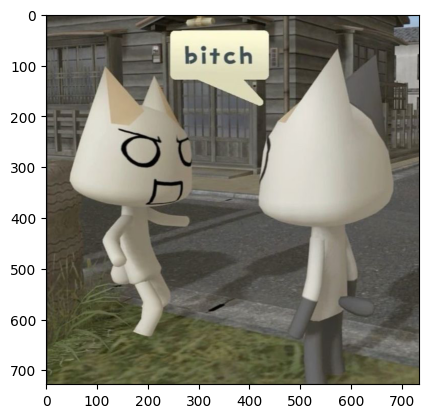

In [97]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:dmqwbsdpbgo4lnnkpgwavrg7/bafkreidm5rst7xov5kkb6xuatarov7do5tmqqdzcb76a3hg2jde4xurrmm@jpeg')

[459, 842, 655, 638, 639, 529, 917, 433, 615, 461]
brassiere, bra, bandeau
swimming trunks, bathing trunks
miniskirt, mini
maillot
maillot, tank suit
diaper, nappy, napkin
comic book
bathing cap, swimming cap
knee pad
breastplate, aegis, egis
False


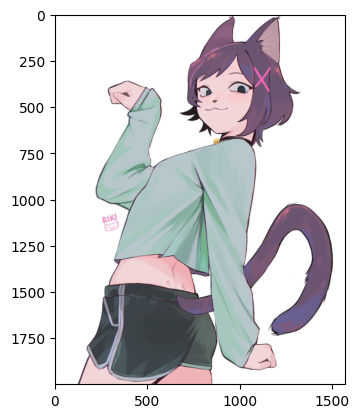

In [98]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:pccvyyf3r4x3vhyied26xcp4/bafkreicjcvnwqb4cdwmabm25yzmx25o72fyxzito6hjlbaz4stzunoxv7u@jpeg')

[917, 600, 731, 643, 419, 823, 680, 570, 610, 796]
comic book
hook, claw
plunger, plumber's helper
mask
Band Aid
stethoscope
nipple
gasmask, respirator, gas helmet
jersey, T-shirt, tee shirt
ski mask
False


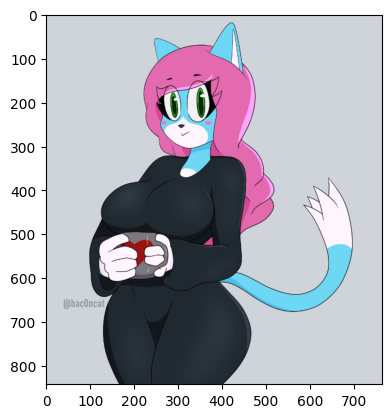

In [99]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:etwwbzan6mr3vnlsnovtsdfk/bafkreie5mr2hb53zedq777ggvdcqrzanksco7qyfyqfsarwdl7fgt5wbz4@jpeg')

[314, 78, 316, 309, 599, 126, 850, 674, 71, 303]
cockroach, roach
tick
cicada, cicala
bee
honeycomb
isopod
teddy, teddy bear
mousetrap
scorpion
long-horned beetle, longicorn, longicorn beetle
False


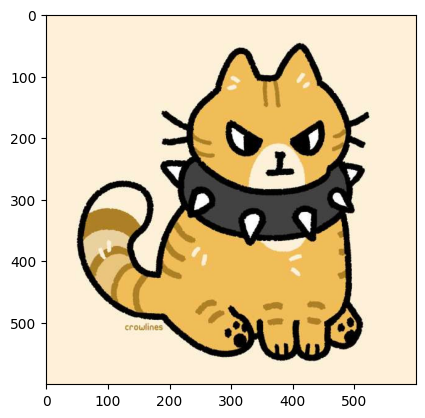

In [100]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:3k2fu5cereuj6mx4jnavvtyc/bafkreidpwggkmsjt3o6rfka4ao52nchdpkikvqd5pr5rsys7b77autnz5y@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[284, 285, 462, 151, 163, 600, 111, 840, 161, 539]
Siamese cat, Siamese
Egyptian cat
broom
Chihuahua
bloodhound, sleuthhound
hook, claw
nematode, nematode worm, roundworm
swab, swob, mop
basset, basset hound
doormat, welcome mat
True


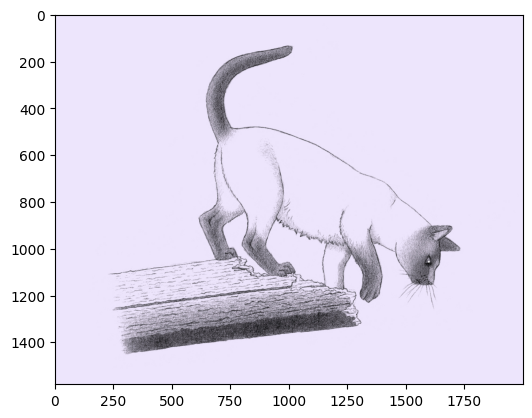

In [101]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:sw3txrm2maycuizkgwwyhuwd/bafkreigzmgelul4doltn2idh5kvk7eyqm27s7py2zjyopkngjbgfhkqy4e@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[917, 921, 692, 922, 549, 446, 868, 611, 860, 551]
comic book
book jacket, dust cover, dust jacket, dust wrapper
packet
menu
envelope
binder, ring-binder
tray
jigsaw puzzle
tobacco shop, tobacconist shop, tobacconist
face powder
False


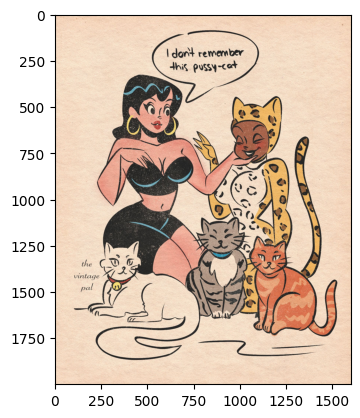

In [102]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:pdmrz4dmsywpxhrrsmixgaqr/bafkreierzsklpwqmrulxqckosfnjrosxbaomuawd3xmshguffdr2mos3ou@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[917, 921, 741, 716, 556, 611, 750, 607, 865, 721]
comic book
book jacket, dust cover, dust jacket, dust wrapper
prayer rug, prayer mat
picket fence, paling
fire screen, fireguard
jigsaw puzzle
quilt, comforter, comfort, puff
jack-o'-lantern
toyshop
pillow
False


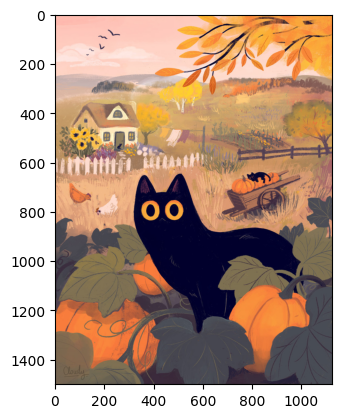

In [103]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:g4k4ppbvhdgdyxucd35cldfj/bafkreifdxla4zuhu4dw2zsh5hjilhp3ct7lqk5gbllhyimpnacc6z6b77a@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[680, 850, 151, 917, 284, 285, 865, 611, 892, 719]
nipple
teddy, teddy bear
Chihuahua
comic book
Siamese cat, Siamese
Egyptian cat
toyshop
jigsaw puzzle
wall clock
piggy bank, penny bank
True


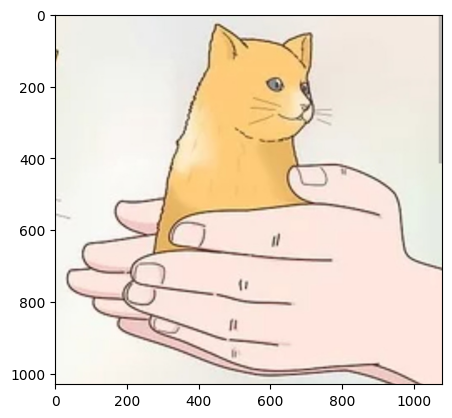

In [104]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:n46ksdhlnz5dhcnbaph2g23x/bafkreiep7gnvui6ylysobvyrygjhpkp4kjgtjjlwtqmbdtmlsmuh5mzhxe@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[917, 361, 921, 384, 731, 280, 43, 285, 461, 862]
comic book
skunk, polecat, wood pussy
book jacket, dust cover, dust jacket, dust wrapper
indri, indris, Indri indri, Indri brevicaudatus
plunger, plumber's helper
grey fox, gray fox, Urocyon cinereoargenteus
frilled lizard, Chlamydosaurus kingi
Egyptian cat
breastplate, aegis, egis
torch
True


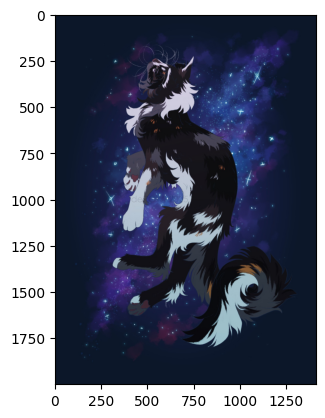

In [105]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:745andd5dlfc2ssyafohfqh6/bafkreiay5wnnjppy4a2srw5ftjlyctxaivbz6slt7gqdevqvpwggmumpga@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[917, 584, 419, 641, 464, 643, 714, 680, 629, 836]
comic book
hair slide
Band Aid
maraca
buckle
mask
pick, plectrum, plectron
nipple
lipstick, lip rouge
sunglass
False


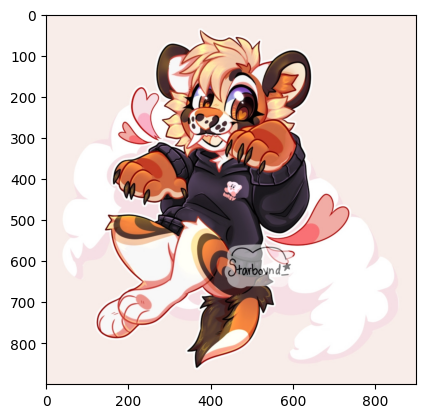

In [106]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:6hh4uzc26ajjurztl6e4w26l/bafkreiahzfhz2bptcawwlyeiothhe3hw4eh6erhbbu3qqwglu3csl6wihe@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[767, 709, 710, 593, 418, 563, 769, 623, 893, 917]
rubber eraser, rubber, pencil eraser
pencil box, pencil case
pencil sharpener
harmonica, mouth organ, harp, mouth harp
ballpoint, ballpoint pen, ballpen, Biro
fountain pen
rule, ruler
letter opener, paper knife, paperknife
wallet, billfold, notecase, pocketbook
comic book
False


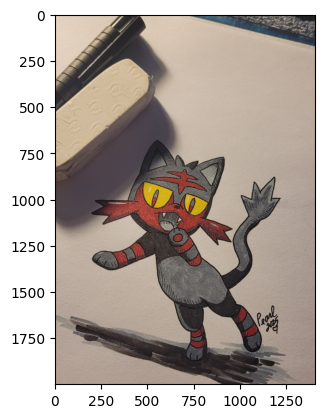

In [107]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:5mx6yqj7lndpj5wpvfio5ypi/bafkreidrix2vpsep2c3qexungfcjynpya7heh52vttgr4mh2gzmilsnzdm@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[51, 284, 163, 363, 268, 285, 225, 227, 151, 676]
triceratops
Siamese cat, Siamese
bloodhound, sleuthhound
armadillo
Mexican hairless
Egyptian cat
malinois
kelpie
Chihuahua
muzzle
True


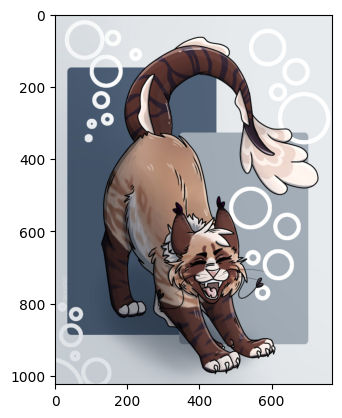

In [108]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:3zhb3gnd2kgwq3yqetyznaqi/bafkreiexrwdpxfqe3li27gngwfdlqkuts5c3lqvtxgrv2kok5h7mckmgfa@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[749, 917, 223, 285, 252, 199, 186, 281, 7, 224]
quill, quill pen
comic book
schipperke
Egyptian cat
affenpinscher, monkey pinscher, monkey dog
Scotch terrier, Scottish terrier, Scottie
Norwich terrier
tabby, tabby cat
cock
groenendael
True


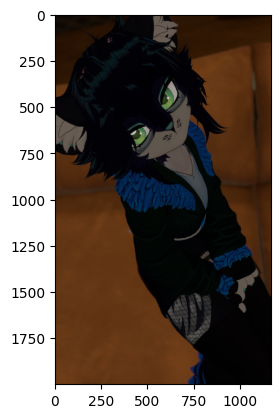

In [109]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:y76yiznstuasp5oe4wobtacz/bafkreigkoxuyvlo4uel4qd3cy3vqhjp5j7yr5mlapw7yvh2do2a3emsc3u@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[292, 282, 288, 290, 293, 291, 917, 286, 289, 287]
tiger, Panthera tigris
tiger cat
leopard, Panthera pardus
jaguar, panther, Panthera onca, Felis onca
cheetah, chetah, Acinonyx jubatus
lion, king of beasts, Panthera leo
comic book
cougar, puma, catamount, mountain lion, painter, panther, Felis concolor
snow leopard, ounce, Panthera uncia
lynx, catamount
True


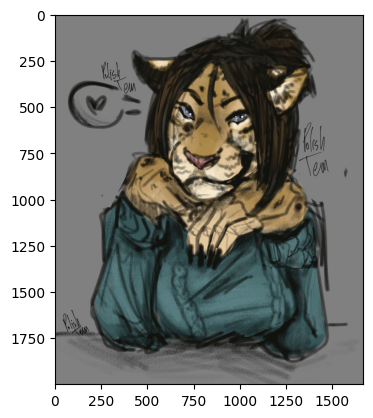

In [110]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:57vovhc6tjmr2mlchyimzibq/bafkreie6pwmo3j6uf5ubulmwr4uuxhqyyxhzu5sub6og5t4m5cqt4gxkga@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[911, 824, 750, 474, 885, 735, 533, 721, 658, 797]
wool, woolen, woollen
stole
quilt, comforter, comfort, puff
cardigan
velvet
poncho
dishrag, dishcloth
pillow
mitten
sleeping bag
False


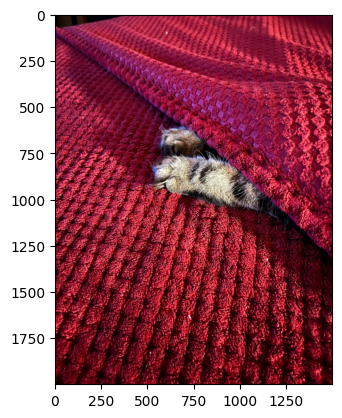

In [111]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:odbfu22e5zzhchbtngy7jvvk/bafkreiddvi6cajnohykcmgqn6dpl7kg7wwmecsf6aya5o4rvfmtkdrhtaq@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[865, 917, 850, 421, 643, 702, 819, 903, 416, 575]
toyshop
comic book
teddy, teddy bear
bannister, banister, balustrade, balusters, handrail
mask
parallel bars, bars
stage
wig
balance beam, beam
golfcart, golf cart
False


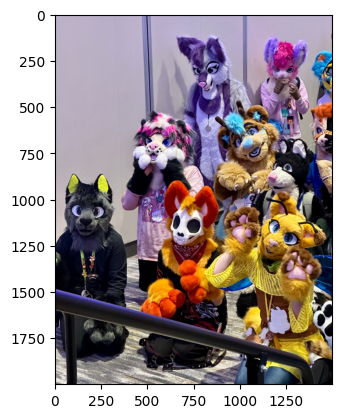

In [112]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:y6wqwvmgj3cvb4y3kywufy4v/bafkreig2y276ziwqutqobktsh5xb6godnonlozddhyebsqbr3a5b7bzo2a@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[284, 334, 281, 285, 287, 282, 650, 359, 356, 380]
Siamese cat, Siamese
porcupine, hedgehog
tabby, tabby cat
Egyptian cat
lynx, catamount
tiger cat
microphone, mike
black-footed ferret, ferret, Mustela nigripes
weasel
titi, titi monkey
True


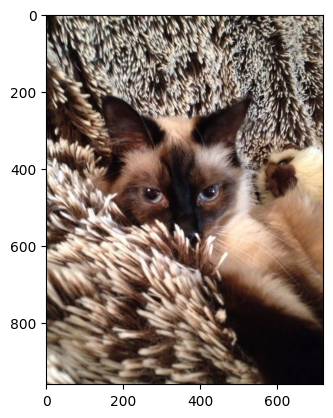

In [113]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:6e7kuh5wkthddvqlwrzgvwic/bafkreigbzbqlw54exu6wv64ds3sjygzntc56zmkv476tix4qug4qqtmgha@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[664, 851, 782, 598, 527, 548, 620, 745, 681, 613]
monitor
television, television system
screen, CRT screen
home theater, home theatre
desktop computer
entertainment center
laptop, laptop computer
projector
notebook, notebook computer
joystick
False


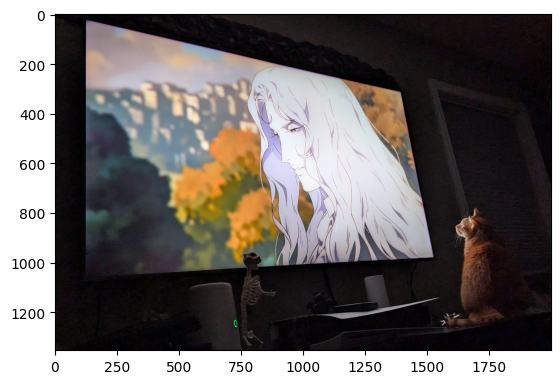

In [114]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:6rr7cpoi66h74hlljcksexfr/bafkreiah35rfg5sucw74q45liv2cep353ehvlw5yyhw3hn2puyc2df3zai@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[885, 750, 797, 841, 285, 237, 911, 721, 282, 811]
velvet
quilt, comforter, comfort, puff
sleeping bag
sweatshirt
Egyptian cat
miniature pinscher
wool, woolen, woollen
pillow
tiger cat
space heater
True


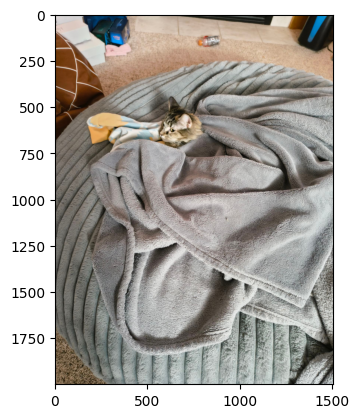

In [115]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:zyvj7rjjoqjia3l2srlx46ns/bafkreiafbdwvpizhybwn6q5klnm3zxkpjq4ci3lteillnjz6enmhtnd22m@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[916, 292, 282, 289, 288, 527, 285, 851, 620, 810]
web site, website, internet site, site
tiger, Panthera tigris
tiger cat
snow leopard, ounce, Panthera uncia
leopard, Panthera pardus
desktop computer
Egyptian cat
television, television system
laptop, laptop computer
space bar
True


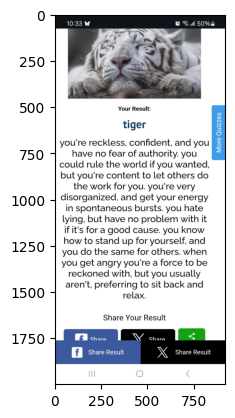

In [116]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:agpethsoaxjroxayo7hak6th/bafkreifigs2eszpentxhqcllbp3kxrupoelebuxqwxmuraliqivq422qhu@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[921, 917, 481, 446, 482, 620, 848, 674, 454, 592]
book jacket, dust cover, dust jacket, dust wrapper
comic book
cassette
binder, ring-binder
cassette player
laptop, laptop computer
tape player
mousetrap
bookshop, bookstore, bookstall
hard disc, hard disk, fixed disk
False


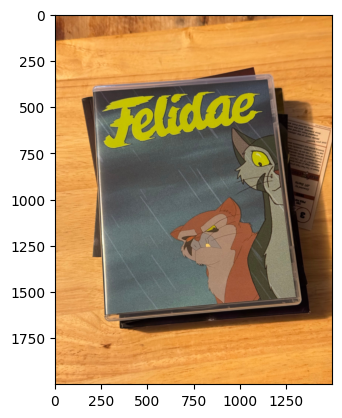

In [117]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:iw62giosnq7nkd6zaw6mrapi/bafkreic3cvgax74aeyzxh36omkzy6equrbezhs3nqxujkvdasq22nxefme@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[285, 330, 905, 331, 794, 904, 921, 281, 282, 332]
Egyptian cat
wood rabbit, cottontail, cottontail rabbit
window shade
hare
shower curtain
window screen
book jacket, dust cover, dust jacket, dust wrapper
tabby, tabby cat
tiger cat
Angora, Angora rabbit
True


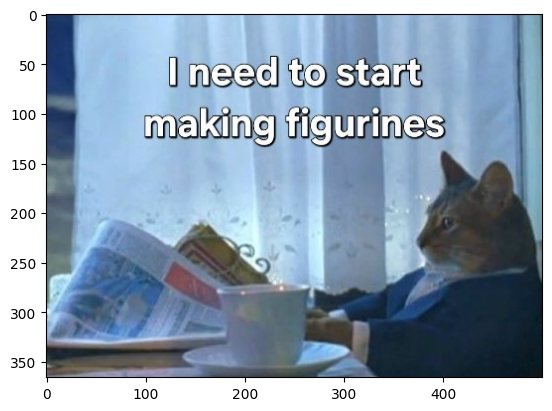

In [118]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:k6p7fm7yqcdng5bxjwvatjsn/bafkreihtmbmivc24oll5ivzeml4cmobp3y6sntl4grmyz6nadq645c6pcu@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[281, 282, 285, 283, 861, 287, 998, 921, 850, 674]
tabby, tabby cat
tiger cat
Egyptian cat
Persian cat
toilet seat
lynx, catamount
ear, spike, capitulum
book jacket, dust cover, dust jacket, dust wrapper
teddy, teddy bear
mousetrap
True


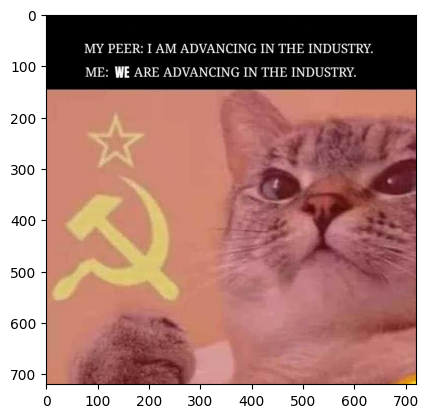

In [119]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:rikebbvai5ovzsson3jrgkro/bafkreidk5m3huvfs2rxogswu2dbplcfvh2s5m36j4wbigfzdsmlkqctbla@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[285, 917, 282, 281, 921, 508, 283, 453, 454, 620]
Egyptian cat
comic book
tiger cat
tabby, tabby cat
book jacket, dust cover, dust jacket, dust wrapper
computer keyboard, keypad
Persian cat
bookcase
bookshop, bookstore, bookstall
laptop, laptop computer
True


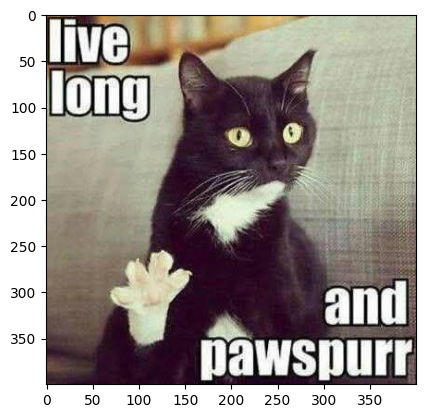

In [120]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:4eigtk6dqnzgdwaqosxubcri/bafkreicwqnbgik24hffbghxjsblr3koazc7kehsw4lqswc2tsswty4nxq4@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[916, 285, 282, 281, 283, 292, 620, 287, 508, 782]
web site, website, internet site, site
Egyptian cat
tiger cat
tabby, tabby cat
Persian cat
tiger, Panthera tigris
laptop, laptop computer
lynx, catamount
computer keyboard, keypad
screen, CRT screen
True


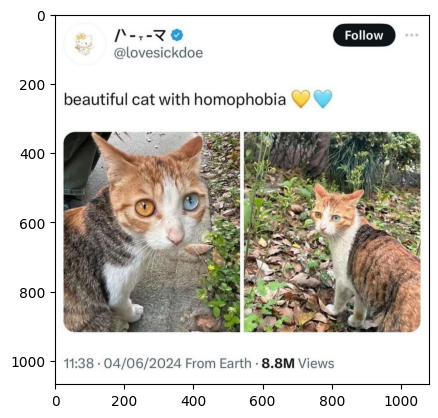

In [121]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:xdwo6pqw7ahphu2egtjukpj3/bafkreiegytdblo3bnpth5g4fffcc76fp3mwj3nmhah2surygn5fgghbfxa@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[916, 285, 282, 281, 918, 851, 921, 284, 508, 283]
web site, website, internet site, site
Egyptian cat
tiger cat
tabby, tabby cat
crossword puzzle, crossword
television, television system
book jacket, dust cover, dust jacket, dust wrapper
Siamese cat, Siamese
computer keyboard, keypad
Persian cat
True


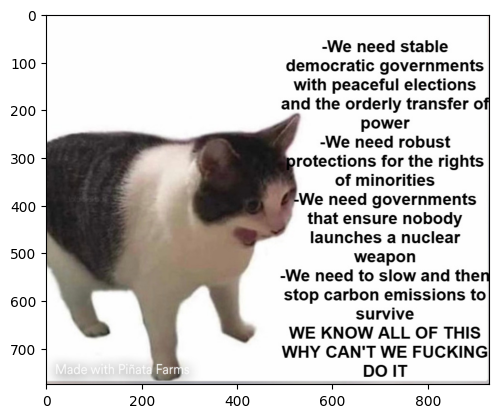

In [122]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:qz2ug5fzvpykfgnoffauafes/bafkreicxgmwpzkh5wdzojmkf4jrdvijhqsme4niws7f54cjc4jhczysc6u@jpeg')

/usr/local/lib/python3.11/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'return_tensor'
  return self.preprocess(images, **kwargs)


[282, 285, 281, 921, 917, 283, 287, 916, 728, 918]
tiger cat
Egyptian cat
tabby, tabby cat
book jacket, dust cover, dust jacket, dust wrapper
comic book
Persian cat
lynx, catamount
web site, website, internet site, site
plastic bag
crossword puzzle, crossword
True


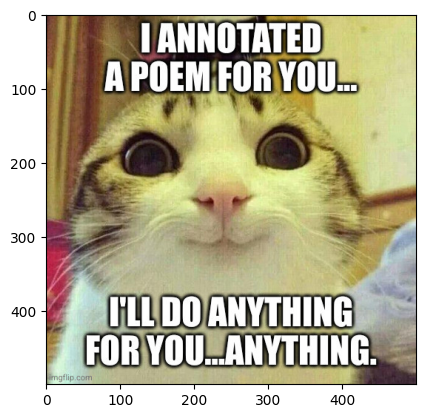

In [123]:
test_bsky_image('https://cdn.bsky.app/img/feed_fullsize/plain/did:plc:qs32bguco3ms2jkidvtsk24x/bafkreibxacuqeuuzijabyngpfcfjrvea7rgy2ptwjnxhnv3eqs7224zbzq@jpeg')

## Takeaways from this first batch of testing
although I wanted to do a pure classification model for cats, and then another for text, it appears that just getting a general list of features works really well.

##ESPECIALLY
because there are some clear "bad words" that are appearing that are things we DON'T want to find in our images.
1. 917 - comic book
2. 916 - web site, website, internet site, site
3. 921 - book jacket, dust cover, dust jacket, dust wrapper

from my perception, these key words appear during our intended fail cases - Drawings, memes posted from other sites, and lots of text. I want to rerun these with 25 or 50 to see if we can get the background cats to trigger trues more

However, a lot of cats in the background of images are not being recognized.

Next step is to rerun these images with a top 50 instead of top 50 or something instead of top 10 and with a fail list to see if that can produce better results